In [1]:
options(warn = -1)
suppressMessages(require(Seurat))
suppressMessages(require(ggplot2))
suppressMessages(require(dplyr))
suppressMessages(require(reticulate))
suppressMessages(require(stringr))
suppressMessages(require(ggpubr))
suppressMessages(require(tidydr))
suppressMessages(require(CellTrek))
suppressMessages(require(CARD))
suppressMessages(require(RColorBrewer))
devtools::load_all('../Cell2Spatial/')

ℹ Loading Cell2Spatial


In [2]:
source('modules/globalParams.R')
source('modules/utils.R')
source('modules/vis.R')
source('modules/reformatProjRes.R')

In [385]:
out.figs.dir <- '../2.results/DLPFC/figs'
out.data.dir <- '../2.results/DLPFC/data'

In [386]:
dir.create(out.figs.dir, showWarnings = FALSE, recursive = TRUE)
dir.create(out.data.dir, showWarnings = FALSE, recursive = TRUE)

In [387]:
MTH_COLOR <- c(
    'Reference'    = 'grey',
    'Cell2Spatial' = '#F7B263',
    'CytoSPACE' = '#D6AA8E',
    'CellTrek' = '#99C0CC',
    'Tangram' = 'lightgreen',
    'Seurat' = '#CC00FF'
)

### Loading DLPFC ST and SC datasets 

In [3]:
brain.st <- readRDS('../0.data/DLPFC/DLPFC_SP3.RDS')

In [4]:
dim(brain.st)

[1] 33514  3639

In [8]:
sum(GetAssayData(brain.st, slot = 'count')>0)
sum(GetAssayData(brain.st, slot = 'count')==0)
113937353 / (8020093 + 113937353)

[1] 8020093

[1] 113937353

[1] 0.9342386

In [9]:
max(colSums(GetAssayData(brain.st, slot = 'count')))
median(colSums(GetAssayData(brain.st, slot = 'count')))

[1] 17436

[1] 4120

In [5]:
brain.sc <- readRDS('../0.data/DLPFC/DLPFC_SC2.RDS')

In [11]:
unique(brain.sc$cluster) %>% length

[1] 17

In [8]:
brain.st <- brain.st %>% SCTransform(., verbose = FALSE, assay = 'Spatial') %>%
    RunPCA(verbose = FALSE) %>%
    RunUMAP(dims = 1 : 30, verbose = FALSE) %>%
    FindNeighbors(., dims = 1:30, verbose = FALSE) %>%
    FindClusters(., verbose = FALSE)

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’



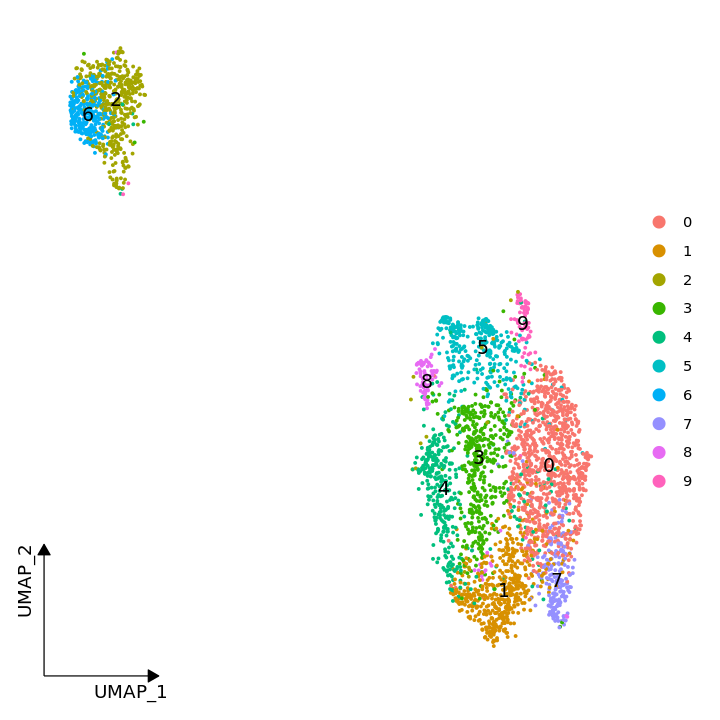

In [9]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(brain.st, reduction = "umap", label = TRUE) + theme_dr(xlength = 0.2, ylength = 0.2, arrow = grid::arrow(length = unit(0.1, "inches"), ends = 'last', type = "closed")) + theme(panel.grid = element_blank())
ggsave(file.path(out.figs.dir, 'DLPFC.ST.cluster.UMAP.dimplot.pdf'), width = 6, height = 6)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


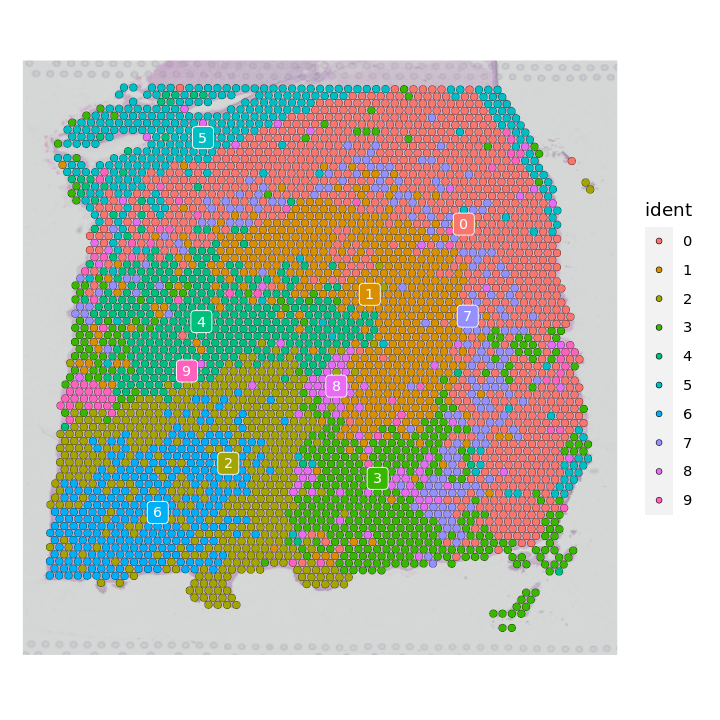

In [10]:
options(repr.plot.width = 6, repr.plot.height = 6)
SpatialDimPlot(brain.st, label = TRUE, label.size = 3, image.alpha = 0.5)
ggsave(file.path(out.figs.dir, 'DLPFC.ST.cluster.UMAP.spatial.pdf'), width = 6, height = 6)

In [11]:
f.ctypes <- levels(brain.st)
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(brain.st, idents = ct) %>% Cells
    SpatialPlot(brain.st, cells.highlight = h.cells) + NoLegend() + ggtitle(ct) 
})

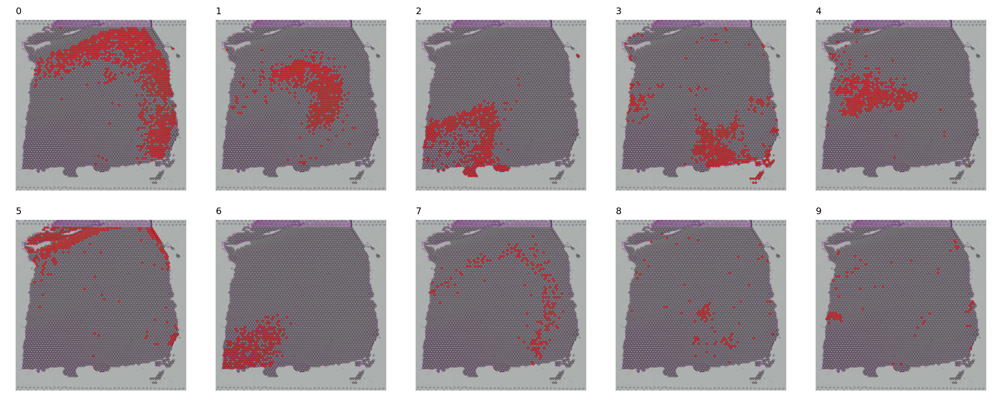

In [12]:
options(repr.plot.width = 20, repr.plot.height = 8)
ggarrange(plotlist = gps, nrow = 2, ncol = 5)

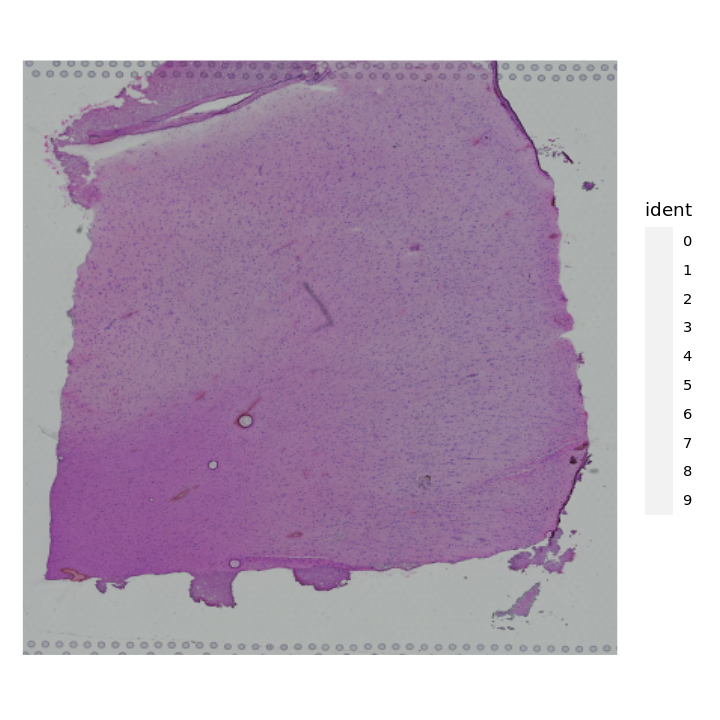

In [13]:
options(repr.plot.width = 6, repr.plot.height = 6)
SpatialDimPlot(brain.st, label = FALSE, label.size = 3,, alpha = 0)
ggsave(file.path(out.figs.dir, 'DLPFC.ST.Image.spatial.pdf'), width = 6, height = 6)

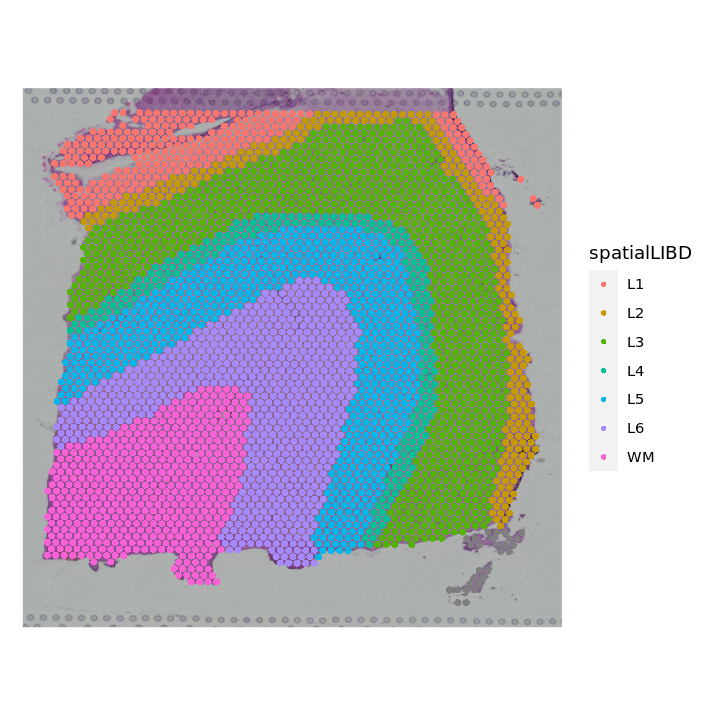

In [448]:
options(repr.plot.width = 6, repr.plot.height = 6)
SpatialDimPlot(brain.st, label = FALSE, label.size = 3, group.by = 'spatialLIBD', stroke = NA)
ggsave(file.path(out.figs.dir, 'DLPFC.ST.spatialLIBD.UMAP.spatial.pdf'), width = 6, height = 6)

In [15]:
f.ctypes <- levels(brain.st$spatialLIBD)
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(brain.st, spatialLIBD == ct) %>% Cells
    SpatialPlot(brain.st, cells.highlight = h.cells) + NoLegend() + ggtitle(ct) 
})

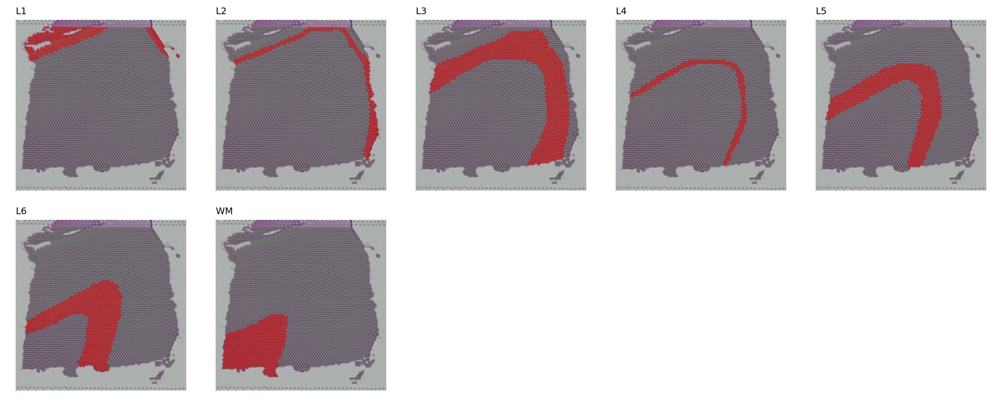

In [16]:
options(repr.plot.width = 20, repr.plot.height = 8)
ggarrange(plotlist = gps, nrow = 2, ncol = 5)

In [446]:
dim(brain.st)

[1] 33514  3639

In [17]:
brain.st@meta.data %>% head

,orig.ident,nCount_Spatial,nFeature_Spatial,barcode,sample_name,tissue,row,col,imagerow,imagecol,⋯,SpatialDE_pool_UMAP_spatial,HVG_UMAP_spatial,pseudobulk_UMAP_spatial,markers_UMAP_spatial,spatialLIBD,ManualAnnotation,nCount_SCT,nFeature_SCT,SCT_snn_res.0.8,seurat_clusters
,<fct>,<dbl>,<int>,<fct>,<int>,<fct>,<int>,<int>,<dbl>,<dbl>,⋯,<int>,<int>,<int>,<int>,<fct>,<chr>,<dbl>,<int>,<fct>,<fct>
AAACAAGTATCTCCCA-1.151673,SeuratProject,8458,3586,AAACAAGTATCTCCCA-1,151673,1,50,102,381.0981,440.6391,⋯,1,1,2,1,L3,NA,4989,3067,0,0
AAACAATCTACTAGCA-1.151673,SeuratProject,1667,1150,AAACAATCTACTAGCA-1,151673,1,3,43,126.3276,259.6310,⋯,1,4,2,3,L1,NA,3603,1297,5,5
AAACACCAATAACTGC-1.151673,SeuratProject,3768,1959,AAACACCAATAACTGC-1,151673,1,59,19,427.7678,183.0783,⋯,7,5,3,2,WM,NA,3847,1955,6,6
AAACAGAGCGACTCCT-1.151673,SeuratProject,5431,2422,AAACAGAGCGACTCCT-1,151673,1,14,94,186.8137,417.2367,⋯,4,2,1,1,L3,NA,4690,2410,0,0
AAACAGCTTTCAGAAG-1.151673,SeuratProject,4277,2263,AAACAGCTTTCAGAAG-1,151673,1,43,9,341.2691,152.7003,⋯,3,8,4,4,L5,NA,4252,2260,9,9
AAACAGGGTCTATATT-1.151673,SeuratProject,4004,2178,AAACAGGGTCTATATT-1,151673,1,47,13,362.9163,164.9415,⋯,3,3,4,4,L6,NA,4020,2176,2,2


In [18]:
brain.sc@meta.data %>% head

,orig.ident,nCount_RNA,nFeature_RNA,cluster,sample,individual,region,age,sex,diagnosis,Capbatch,Seqbatch,post.mortem.interval..hours.,RNA.Integrity.Number,genes,UMIs,RNA.mitochondr..percent,RNA.ribosomal.percent
,<fct>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<int>,<dbl>,<dbl>
GCCAAATCACAGAGGT-1_5294_BA24,DLPFC,867,692,Neu-NRGN-II,5294_BA24,5294,ACC,19,M,ASD,CB8,SB3,16,7.5,728,911,1.9758507,0.7683864
TCAACGATCGTCTGCT-1_5294_BA24,DLPFC,610,484,Neu-NRGN-II,5294_BA24,5294,ACC,19,M,ASD,CB8,SB3,16,7.5,504,638,2.0376176,1.7241379
CACCTTGCATGGTTGT-1_5387_BA9,DLPFC,628,513,Neu-NRGN-II,5387_BA9,5387,PFC,12,M,Control,CB6,SB2,13,7.6,547,667,3.5982009,2.2488756
CCTCAGTCACCCTATC-1_5242_BA24,DLPFC,756,598,Neu-NRGN-II,5242_BA24,5242,ACC,15,M,Control,CB3,SB1,9,7.9,639,804,0.9950249,2.2388060
TATTACCAGGATGGAA-1_5387_BA9,DLPFC,603,515,Neu-NRGN-II,5387_BA9,5387,PFC,12,M,Control,CB6,SB2,13,7.6,544,633,2.0537125,1.2638231
CTCATTAGTACTCGCG-1_5554_BA24,DLPFC,607,518,Neu-NRGN-II,5554_BA24,5554,ACC,13,F,Control,CB9,SB3,15,8.3,544,638,1.0971787,1.5673981


In [19]:
Idents(brain.sc) <- brain.sc$cluster

In [20]:
brain.sc <- SCTransform(brain.sc, ncells = 3000, verbose = FALSE) %>%
    RunPCA(verbose = FALSE) %>%
    RunUMAP(dims = 1 : 30, verbose = FALSE)

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’



In [274]:
set.seed(88888) 
cell.colors <- randomcoloR::distinctColorPalette(length(unique(brain.sc$cluster))) %>% `names<-`(unique(brain.sc$cluster))

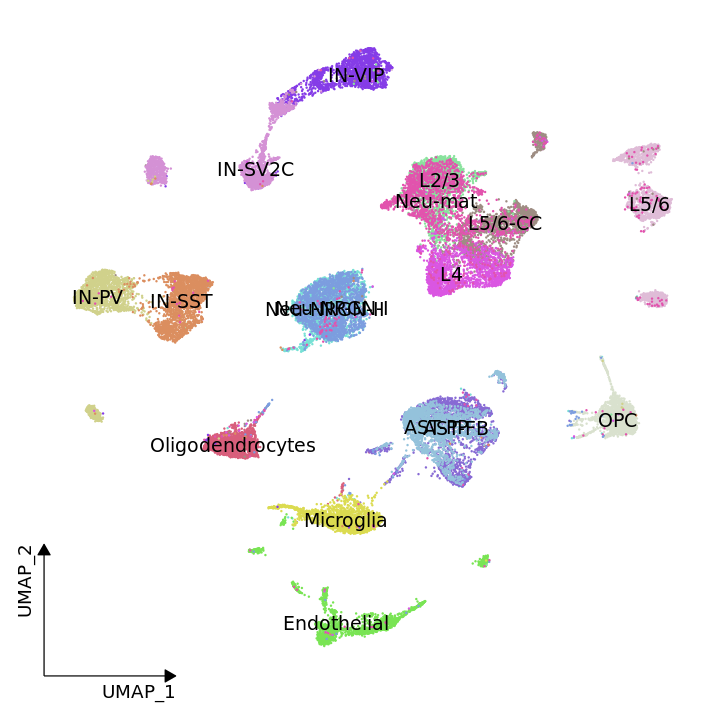

In [275]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(brain.sc, label = TRUE, cols = cell.colors) + theme_dr(xlength = 0.2, ylength = 0.2, arrow = grid::arrow(length = unit(0.1, "inches"), ends = 'last', type = "closed")) + theme(panel.grid = element_blank()) + NoLegend()
ggsave(file.path(out.figs.dir, 'DLPFC.SC.cluster.UMAP.dimplot.pdf'), width = 6, height = 6)

In [23]:
levels(brain.sc) %>% length
levels(brain.sc)

[1] 17

[1] "Neu-NRGN-II"      "L5/6"             "Oligodendrocytes" "OPC"             
 [5] "AST-FB"           "Endothelial"      "Microglia"        "Neu-NRGN-I"      
 [9] "IN-VIP"           "L5/6-CC"          "IN-SV2C"          "L2/3"            
[13] "IN-PV"            "L4"               "IN-SST"           "Neu-mat"         
[17] "AST-PP"

In [24]:
dim(brain.sc)

[1] 17529 33914

In [82]:
markers.sc <- FindAllMarkers(brain.sc, only.pos = TRUE, logfc.threshold = 0.25, min.pct = 0.25, assay = 'SCT')

Calculating cluster Neu-NRGN-II

Calculating cluster L5/6

Calculating cluster Oligodendrocytes

Calculating cluster OPC

Calculating cluster AST-FB

Calculating cluster Endothelial

Calculating cluster Microglia

Calculating cluster Neu-NRGN-I

Calculating cluster IN-VIP

Calculating cluster L5/6-CC

Calculating cluster IN-SV2C

Calculating cluster L2/3

Calculating cluster IN-PV

Calculating cluster L4

Calculating cluster IN-SST

Calculating cluster Neu-mat

Calculating cluster AST-PP



In [26]:
#openxlsx::write.xlsx(markers, file = file.path(out.data.dir, 'Thymus.ST.markers.xlsx'))

In [83]:
top20.markers.sc <- markers.sc %>% group_by(cluster) %>% top_n(n = 100, wt = avg_log2FC)

In [28]:
#saveRDS(brain.sc, file = file.path(out.data.dir, 'brain.sc.RDS'))
#saveRDS(brain.st, file = file.path(out.data.dir, 'brain.st.RDS'))

In [29]:
ovp.genes <- intersect(top20.markers$gene %>% unique, rownames(brain.st))
brain.st.sub <- brain.st[ovp.genes, ]
brain.sc.sub <- brain.sc[ovp.genes, ]

In [30]:
avg.st <- AverageExpression(brain.st.sub, group.by = 'spatialLIBD', assay = 'SCT')$SCT
avg.sc <- AverageExpression(brain.sc.sub, assay = 'SCT')$SCT

Removing cells with NA for 1 or more grouping variables



In [31]:
head(avg.st)
head(avg.sc)

,L1,L2,L3,L4,L5,L6,WM
CHN1,3.611722,5.490119,6.098079,5.513761,6.025260,5.776012,2.333333
CALM1,8.146520,10.865613,10.069767,9.766055,9.120357,8.835260,5.553606
RTN1,4.256410,5.549407,6.838220,6.935780,7.375929,5.924855,2.654971
ATP1B1,4.923077,6.177866,7.250758,8.045872,6.530461,4.921965,3.998051
CCK,5.776557,7.533597,7.996967,6.577982,4.973254,6.589595,2.417154
RTN4,3.509158,5.201581,4.417594,3.568807,4.154532,4.099711,3.502924


,Neu-NRGN-II,L5/6,Oligodendrocytes,OPC,AST-FB,Endothelial,Microglia,Neu-NRGN-I,IN-VIP,L5/6-CC,IN-SV2C,L2/3,IN-PV,L4,IN-SST,Neu-mat,AST-PP
CHN1,9.6130,3.9495,1.159,1.0390,1.8155,1.3070,1.4595,13.3545,0.4425,4.2320,0.292581,4.0600,0.5420,4.2230,1.1285,3.7610,1.1155
CALM1,6.0275,1.4680,1.172,0.7340,1.3175,1.4880,1.0865,7.9950,1.1895,1.9615,1.300418,1.5465,1.0115,1.7790,1.2280,1.8020,0.6565
RTN1,5.3560,1.6970,0.838,0.6675,0.8315,0.8265,0.7635,7.1170,1.3265,1.9675,1.349007,1.3840,1.0000,1.9305,1.3800,1.6460,0.2390
ATP1B1,5.3430,1.2795,1.254,0.3800,0.6990,0.4515,0.6715,6.2980,2.2330,1.2745,2.178161,1.0365,3.2060,0.9880,2.0075,1.5890,0.2070
CCK,4.4540,0.2105,0.484,0.3335,0.5165,0.5060,0.5840,5.8380,3.4165,1.8965,2.098746,1.0840,0.2475,1.3225,0.2435,0.9725,0.2215
RTN4,5.8515,1.2585,3.029,1.0305,1.3635,1.2925,1.7430,7.1605,1.2350,1.6395,1.181296,1.8260,1.2660,1.4230,1.0300,1.8525,0.8230


In [32]:
true.mat <- apply(avg.st, 2, function(xx) {
    apply(avg.sc, 2, function(yy) {
        cor(xx, yy)
    })
}) 

### Showing the projection performance for Cell2Spatial

In [395]:
cell2spatial <- readRDS('../2.results/DLPFC/data/DLPFC.cell2spatial.RDS')$obj

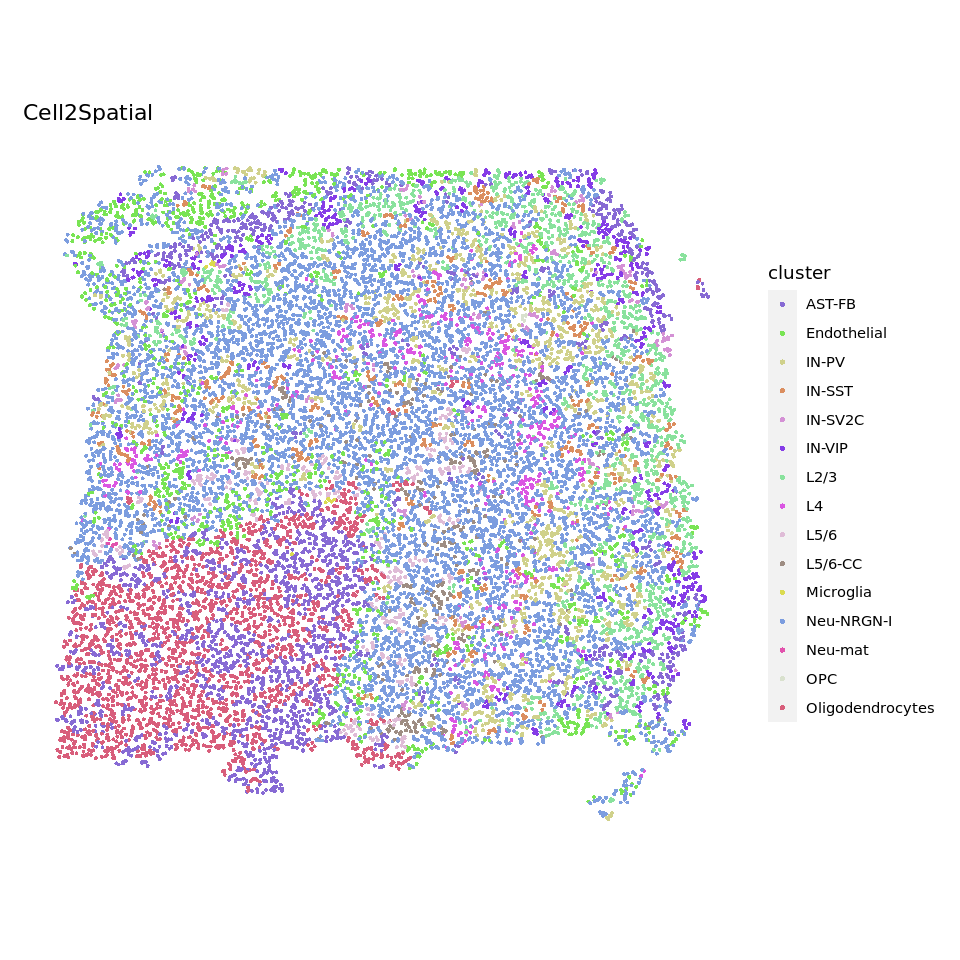

In [443]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cell2spatial, group.by = 'cluster', pt.size = 0.68, image.alpha = 0, stroke = NA, cols = cell.colors) + ggtitle('Cell2Spatial')
ggsave(file.path(out.figs.dir, 'cell2spatial.entire.UMAP.pdf'), width = 8, height = 6)

In [278]:
length(cell2spatial$CellType %>% unique)

[1] 15

In [279]:
f.ctypes <- cell2spatial$CellType %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cell2spatial, CellType == ct) %>% Cells
    obj.sub <- cell2spatial[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 1, group.by = 'CellType',  pt.size.factor = 1, crop = FALSE, stroke = 0, cols = cell.colors[ct]) + ggtitle(ct) + NoLegend()  
})

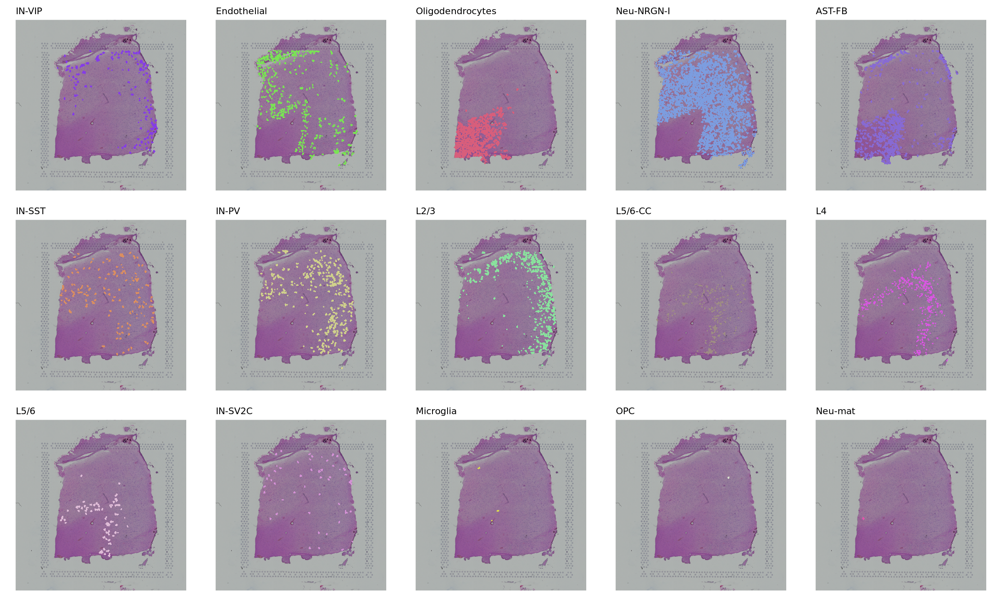

In [280]:
options(repr.plot.width = 20, repr.plot.height = 12)
ggarrange(plotlist = gps, nrow = 3, ncol = 5)
ggsave(file.path(out.figs.dir, 'cell2spatial.split.UMAP.pdf'), width = 20, height = 12)
ggsave(file.path(out.figs.dir, 'cell2spatial.split.UMAP.eps'), width = 20, height = 12)

In [339]:
cell2spatial$CellType <- factor(cell2spatial$CellType, levels = names(cell.colors))
cell.counts <- lapply(levels(brain.st$spatialLIBD), function(zone) {
    cells <- subset(brain.st, spatialLIBD == zone) %>% Cells
    meta.sub <- cell2spatial@meta.data[cell2spatial$SpotName %in% cells, ]
    table(meta.sub$CellType)    
}) %>% do.call(rbind, .) %>% `rownames<-`(levels(brain.st$spatialLIBD))
prop.xx <- sweep(cell.counts, 1, rowSums(cell.counts), '/')
cell2spatial.order <- prop.xx <- sweep(prop.xx, 2, colSums(prop.xx), '/')
options(repr.plot.width = 6, repr.plot.height = 4)
pheatmap::pheatmap(prop.xx, cluster_cols = FALSE, cluster_rows = FALSE, border_color = NA, color = colorRampPalette(rev(brewer.pal(n = 7, name = "RdYlGn")))(100), filename = file.path(out.figs.dir, 'cell2spatial.pheatmap.pdf'), width = 8, height = 4)

### Showing the projection performance for CytoSpace

In [396]:
cytospace <- forCytoSpace('../2.results/DLPFC/data/cytospace/', brain.sc, brain.st)

In [283]:
head(cytospace@meta.data)

,orig.ident,nCount_Spatial,nFeature_Spatial,UniqueCID,OriginalCID,CellType,SpotID,row,col,x.new,y.new
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
UCID00000,Cell2Spatial,1759,732,UCID00000,GCCAAATCACAGAGGT-1_5294_BA24,Neu-NRGN-II,ACGATACATAGAACTA-1.151673,152.6103,163.3663,154.8109,164.6319
UCID00001,Cell2Spatial,1441,580,UCID00001,TCAACGATCGTCTGCT-1_5294_BA24,Neu-NRGN-II,GAGCTGTCGTCTCGGA-1.151673,321.9622,468.9469,320.3567,468.1074
UCID00002,Cell2Spatial,1498,579,UCID00002,CACCTTGCATGGTTGT-1_5387_BA9,Neu-NRGN-II,GCGTCGCCAGGGTGAT-1.151673,343.5644,468.8119,345.7310,469.8881
UCID00003,Cell2Spatial,1634,657,UCID00003,CCTCAGTCACCCTATC-1_5242_BA24,Neu-NRGN-II,TATCCTGCATGGGAAT-1.151673,403.0153,490.0540,401.2369,488.9019
UCID00004,Cell2Spatial,1469,590,UCID00004,TATTACCAGGATGGAA-1_5387_BA9,Neu-NRGN-II,AGAGCAGTTATGAGAC-1.151673,169.6670,284.1134,167.8504,284.9783
UCID00005,Cell2Spatial,1428,609,UCID00005,CTCATTAGTACTCGCG-1_5554_BA24,Neu-NRGN-II,GGGCCGGCCGAAGTAC-1.151673,358.6409,316.8317,355.6741,316.0151


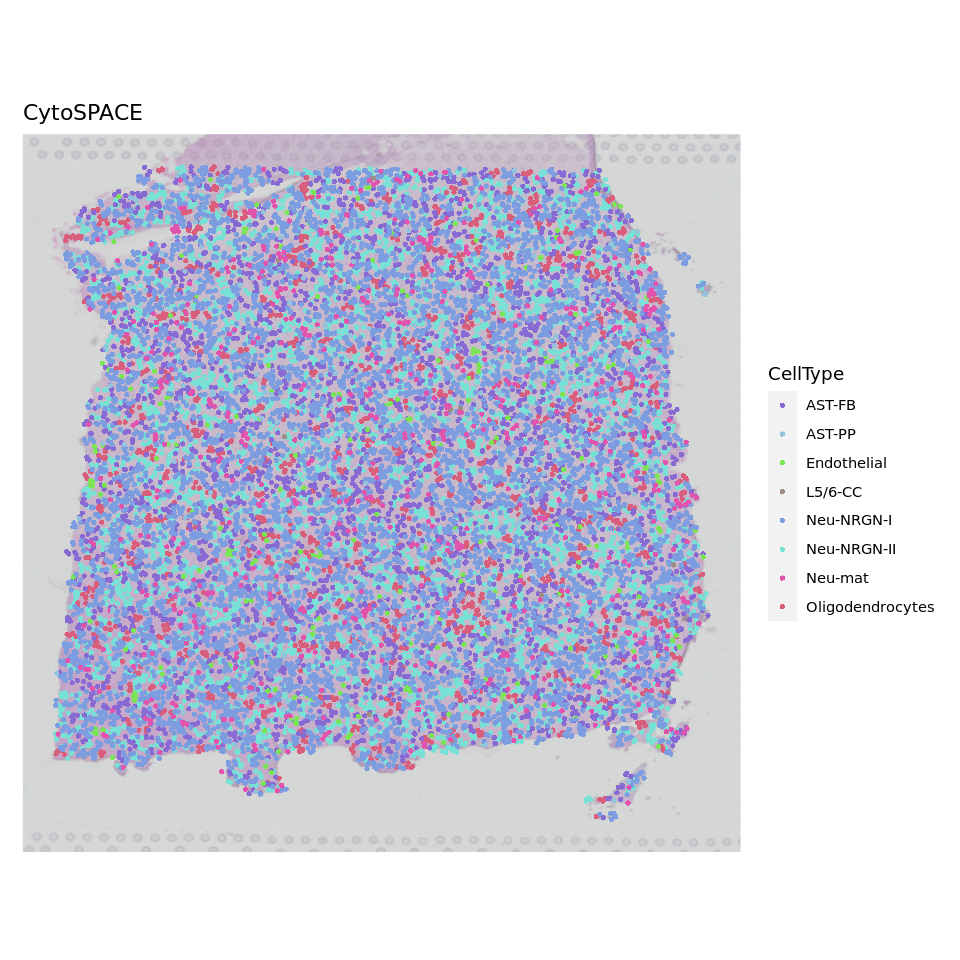

In [444]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cytospace, group.by = 'CellType', pt.size = 0.9, image.alpha = 0.5, cols = cell.colors, stroke = NA) + ggtitle('CytoSPACE')
ggsave(file.path(out.figs.dir, 'cytospace.entire.UMAP.pdf'), width = 8, height = 6)

In [285]:
length(cytospace$CellType %>% unique)

[1] 8

In [286]:
f.ctypes <- cytospace$CellType %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cytospace, CellType == ct) %>% Cells
    obj.sub <- cytospace[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 1, group.by = 'CellType', cols = cell.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

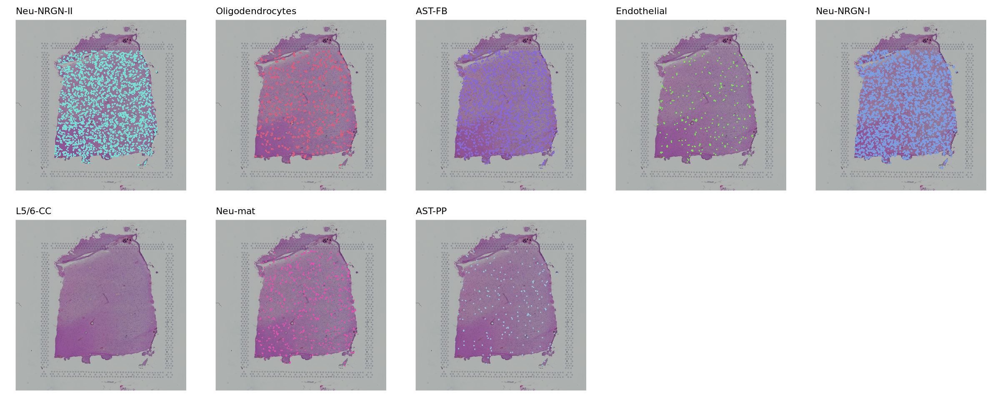

In [287]:
options(repr.plot.width = 20, repr.plot.height = 8)
ggarrange(plotlist = gps, nrow = 2, ncol = 5)
ggsave(file.path(out.figs.dir, 'cytospace.split.UMAP.pdf'), width = 20, height = 8)
ggsave(file.path(out.figs.dir, 'cytospace.split.UMAP.eps'), width = 20, height = 8)

In [289]:
cytospace$SpotName <- cytospace$SpotID

In [340]:
cytospace$CellType <- factor(cytospace$CellType, levels = names(cell.colors))
cell.counts <- lapply(levels(brain.st$spatialLIBD), function(zone) {
    cells <- subset(brain.st, spatialLIBD == zone) %>% Cells
    meta.sub <- cytospace@meta.data[cytospace$SpotName %in% cells, ]
    table(meta.sub$CellType)    
}) %>% do.call(rbind, .) %>% `rownames<-`(levels(brain.st$spatialLIBD))

prop.xx <- sweep(cell.counts, 2, colSums(cell.counts), '/')
options(repr.plot.width = 6, repr.plot.height = 4)
pheatmap::pheatmap(prop.xx, cluster_cols = FALSE, cluster_rows = FALSE, border_color = NA, color = colorRampPalette(rev(brewer.pal(n = 7, name = "RdYlGn")))(100), filename = file.path(out.figs.dir, 'cytospace.pheatmap.pdf'), width = 8, height = 4)

### Showing the projection performance for tangram

In [397]:
obj.st <- brain.st
rownames(obj.st@images$T1@coordinates) <- gsub('\\.', '-', rownames(obj.st@images$T1@coordinates))

In [398]:
tangram <- forTangram('../2.results/DLPFC/data/DLPFC_tangram.xls', brain.sc, obj.st)

In [392]:
head(tangram@meta.data)

,orig.ident,nCount_Spatial,nFeature_Spatial,X,nCount_RNA,nFeature_RNA,cluster,sample,individual,region,⋯,RNA.Integrity.Number,genes,UMIs,RNA.mitochondr..percent,RNA.ribosomal.percent,SpotID,row,col,x.new,y.new
,<int>,<dbl>,<int>,<chr>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,⋯,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
GCCAAATCACAGAGGT-1_5294_BA24,0,867,692,GCCAAATCACAGAGGT-1_5294_BA24,867,692,Neu-NRGN-II,5294_BA24,5294,ACC,⋯,7.5,728,911,1.9758507,0.7683864,GGGCGATATGTGTGAA-1-151673,261.4762,305.1305,261.8275,305.3325
TCAACGATCGTCTGCT-1_5294_BA24,0,610,484,TCAACGATCGTCTGCT-1_5294_BA24,610,484,Neu-NRGN-II,5294_BA24,5294,ACC,⋯,7.5,504,638,2.0376176,1.7241379,TGGCATGAAGTTTGGG-1-151673,411.4312,161.5212,409.3597,160.4380
CACCTTGCATGGTTGT-1_5387_BA9,0,628,513,CACCTTGCATGGTTGT-1_5387_BA9,628,513,Neu-NRGN-II,5387_BA9,5387,PFC,⋯,7.6,547,667,3.5982009,2.2488756,GAGCTGTCGTCTCGGA-1-151673,219.4870,460.3961,221.8264,461.5581
CCTCAGTCACCCTATC-1_5242_BA24,0,756,598,CCTCAGTCACCCTATC-1_5242_BA24,756,598,Neu-NRGN-II,5242_BA24,5242,ACC,⋯,7.9,639,804,0.9950249,2.2388060,ACTGAAACGCCGTTAG-1-151673,418.6319,412.4663,416.7929,411.2750
TATTACCAGGATGGAA-1_5387_BA9,0,603,515,TATTACCAGGATGGAA-1_5387_BA9,603,515,Neu-NRGN-II,5387_BA9,5387,PFC,⋯,7.6,544,633,2.0537125,1.2638231,ACGTGGTCGAATGTGC-1-151673,121.7372,368.1368,120.0476,368.9412
CTCATTAGTACTCGCG-1_5554_BA24,0,607,518,CTCATTAGTACTCGCG-1_5554_BA24,607,518,Neu-NRGN-II,5554_BA24,5554,ACC,⋯,8.3,544,638,1.0971787,1.5673981,AGAGGCTTCGGAAACC-1-151673,386.4537,437.4888,383.7335,436.7400


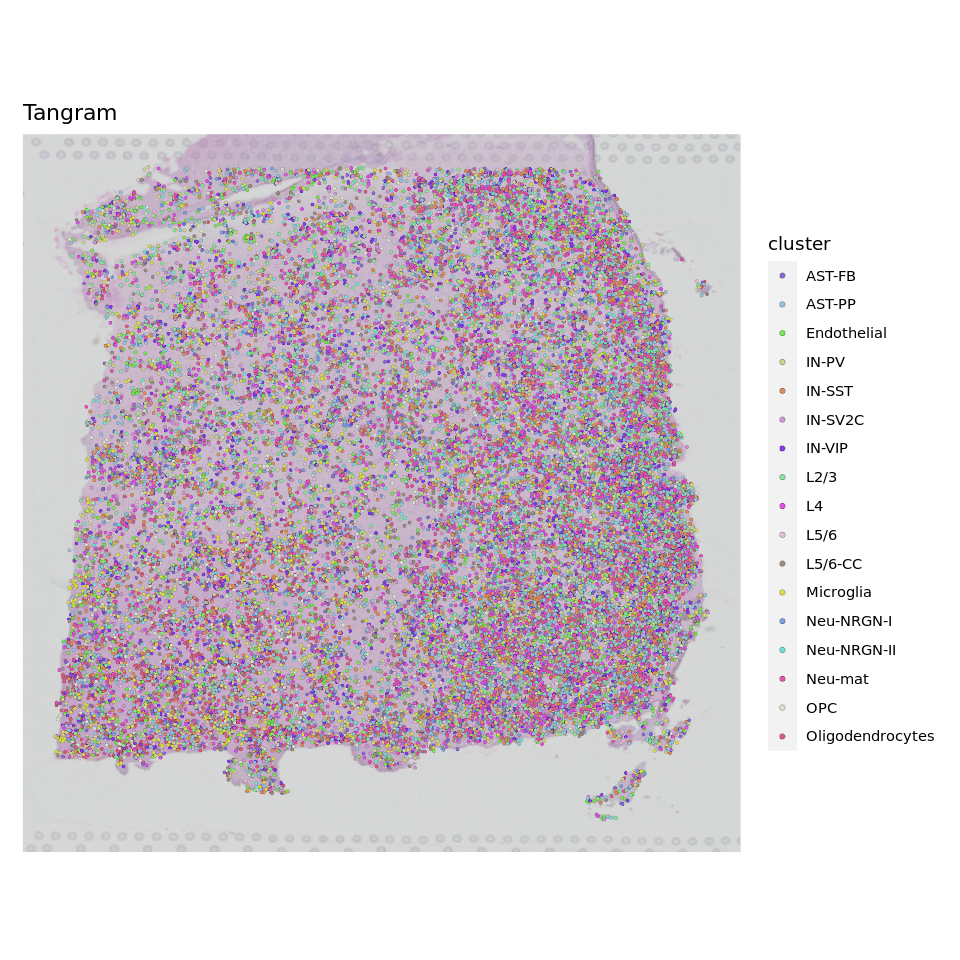

In [393]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(tangram, group.by = 'cluster', pt.size = 0.6, image.alpha = 0.5, cols = cell.colors, stroke = 0.1) + ggtitle('Tangram')
ggsave(file.path(out.figs.dir, 'tangram.entire.UMAP.pdf'), width = 8, height = 6)

In [394]:
length(f.ctypes <- tangram$cluster %>% unique)

[1] 17

In [296]:
f.ctypes <- tangram$cluster %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(tangram, cluster == ct) %>% Cells
    obj.sub <- tangram[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 0.5, group.by = 'cluster', cols = cell.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

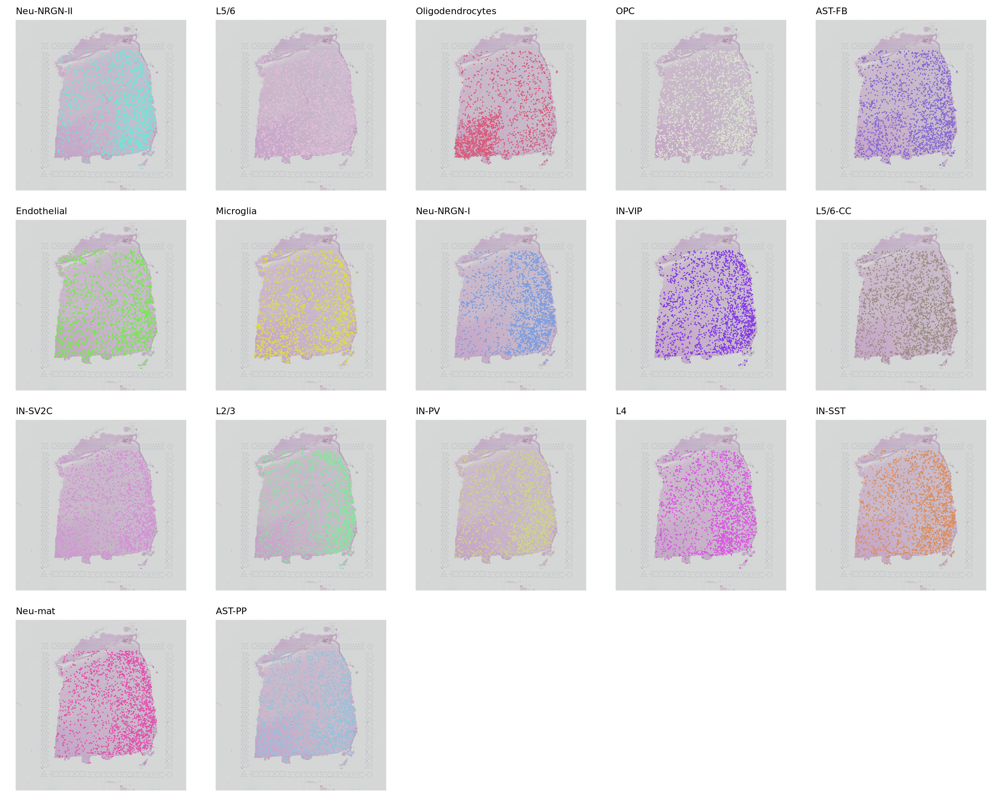

In [297]:
options(repr.plot.width = 20, repr.plot.height = 16)
ggarrange(plotlist = gps, nrow = 4, ncol = 5)
ggsave(file.path(out.figs.dir, 'tangram.split.UMAP.pdf'), width = 20, height = 16)
ggsave(file.path(out.figs.dir, 'tangram.split.UMAP.eps'), width = 20, height = 16)

In [342]:
tangram$SpotName <- tangram$SpotID
tangram$cluster <- factor(tangram$cluster, levels = names(cell.colors))
cell.counts <- lapply(levels(brain.st$spatialLIBD), function(zone) {
    cells <- subset(brain.st, spatialLIBD == zone) %>% Cells
    meta.sub <- tangram@meta.data[gsub('1-', '1\\.', tangram$SpotName) %in% cells, ]
    table(meta.sub$cluster)    
}) %>% do.call(rbind, .) %>% `rownames<-`(levels(brain.st$spatialLIBD))

prop.xx <- sweep(cell.counts, 2, colSums(cell.counts), '/')
options(repr.plot.width = 6, repr.plot.height = 4)
pheatmap::pheatmap(prop.xx, cluster_cols = FALSE, cluster_rows = FALSE, border_color = NA, color = colorRampPalette(rev(brewer.pal(n = 7, name = "RdYlGn")))(100), filename = file.path(out.figs.dir, 'tangram.pheatmap.pdf'), width = 8, height = 4)

### Showing the projection performance for Celltrek

In [51]:
cell.trek <- readRDS('../2.results/DLPFC/data/DLPFC.celltrek.RDS') %>% { forCellTrek(list(xx = .), brain.sc, brain.st) }

In [399]:
cell.trek <- readRDS(file = file.path(out.data.dir, 'celltrek.reformat.RDS'))

In [301]:
cell.trek@meta.data %>% head

,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_RNA,nFeature_RNA,cluster,sample,individual,region,age,⋯,RNA.ribosomal.percent,id_raw,id_new,coord_x,coord_y,Spot,centerX,centerY,imagerow,imagecol
,<fct>,<dbl>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<int>,⋯,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
GATCGATGTTATCCGA-1_4849_BA24,DLPFC,1653,637,763,584,Oligodendrocytes,4849_BA24,4849,ACC,7,⋯,0.9828010,GATCGATGTTATCCGA-1_4849_BA24,GATCGATGTTATCCGA.1_4849_BA24,2450.390,4325.803,CTTCGTGCCCGCATCG-1.151673,109.7210,194.6895,110.2786,194.6806
CCCATACGTATATCCG-1_5531_BA9,DLPFC,1822,902,1382,902,AST-PP,5531_BA9,5531,PFC,15,⋯,0.7973422,CCCATACGTATATCCG-1_5531_BA9,CCCATACGTATATCCG.1_5531_BA9,2536.462,4536.709,GACGGGATGTCTTATG-1.151673,115.1665,203.9604,114.1522,204.1723
CGTCCATGTCTCGTTC-1_5531_BA24,DLPFC,1909,1142,1743,1142,AST-PP,5531_BA24,5531,ACC,15,⋯,0.5741127,CGTCCATGTCTCGTTC-1_5531_BA24,CGTCCATGTCTCGTTC.1_5531_BA24,2573.211,4512.662,GACGGGATGTCTTATG-1.151673,115.1665,203.9604,115.8061,203.0901
GTATCTTGTAACGTTC-1_5893_BA24,DLPFC,1504,611,598,498,Endothelial,5893_BA24,5893,ACC,19,⋯,3.3018868,GTATCTTGTAACGTTC-1_5893_BA24,GTATCTTGTAACGTTC.1_5893_BA24,2431.622,4601.508,GGCGAGCATCGAGGAC-1.151673,109.8110,207.0657,109.4339,207.0886
GCTCCTATCATGTCTT-1_4849_BA24,DLPFC,2489,1727,29426,6788,L5/6,4849_BA24,4849,ACC,7,⋯,0.4208623,GCTCCTATCATGTCTT-1_4849_BA24,GCTCCTATCATGTCTT.1_4849_BA24,2606.606,4669.372,CGCGTGCTATCAACGA-1.151673,115.2115,210.1260,117.3090,210.1427
CTACATTGTGACCAAG-1_5294_BA24,DLPFC,2534,1742,15263,5016,L5/6,5294_BA24,5294,ACC,19,⋯,0.5428299,CTACATTGTGACCAAG-1_5294_BA24,CTACATTGTGACCAAG.1_5294_BA24,2528.639,4699.688,CGCGTGCTATCAACGA-1.151673,115.2115,210.1260,113.8002,211.5071


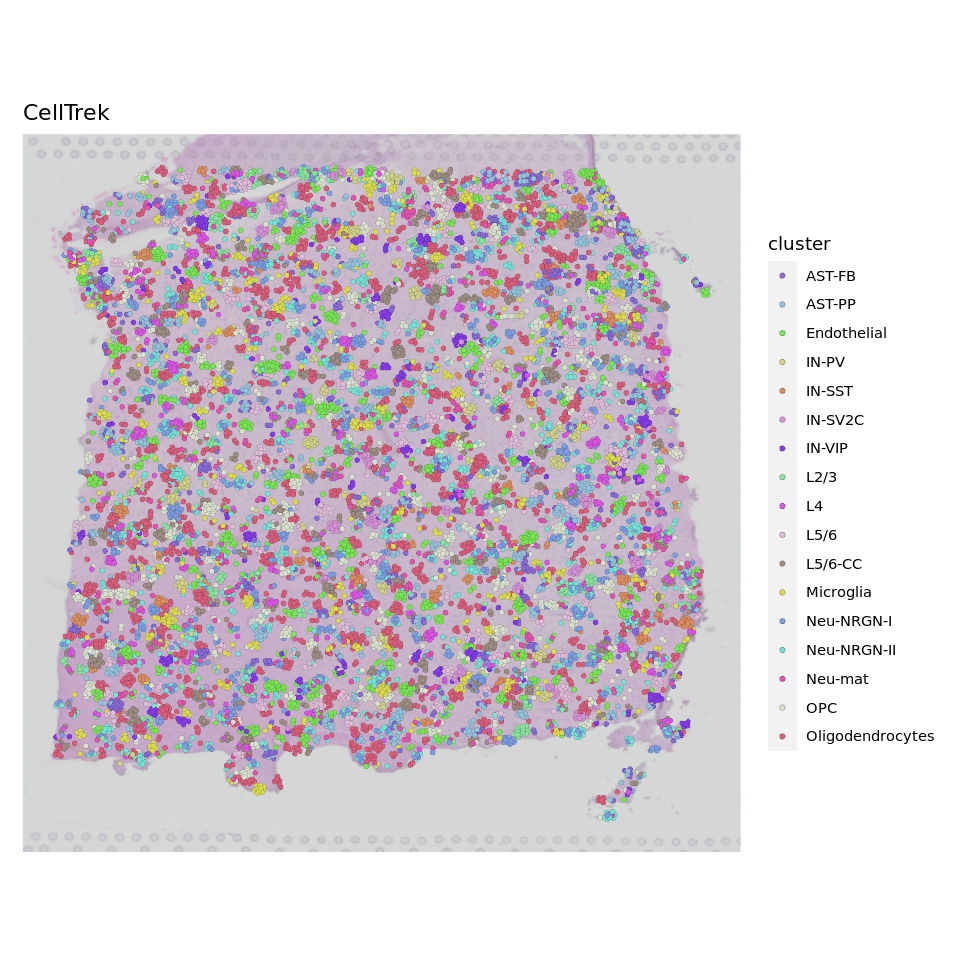

In [302]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cell.trek, group.by = 'cluster', pt.size = 0.9, image.alpha = 0.5, cols = cell.colors, stroke = 0.1) + ggtitle('CellTrek')
ggsave(file.path(out.figs.dir, 'celltrek.entire.UMAP.pdf'), width = 8, height = 6)

In [303]:
length(f.ctypes <- cell.trek$cluster %>% unique)

[1] 17

In [304]:
f.ctypes <- cell.trek$cluster %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cell.trek, cluster == ct) %>% Cells
    obj.sub <- cell.trek[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 1, group.by = 'cluster', cols = cell.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

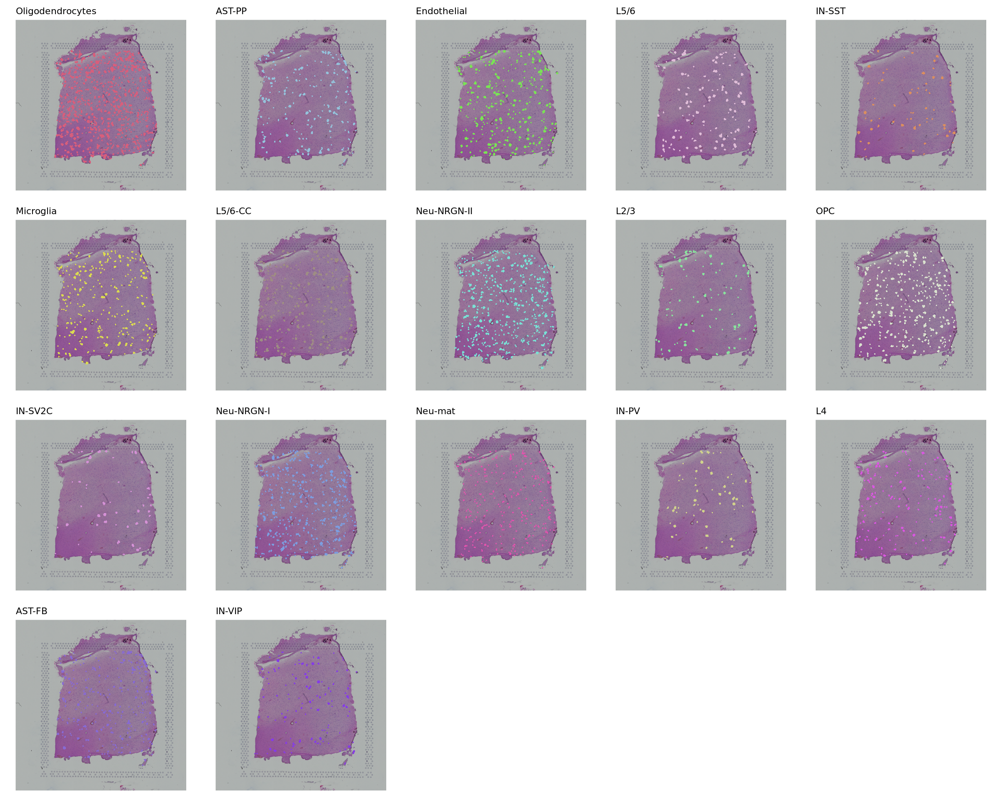

In [305]:
options(repr.plot.width = 20, repr.plot.height = 16)
ggarrange(plotlist = gps, nrow = 4, ncol = 5)
ggsave(file.path(out.figs.dir, 'celltrek.split.UMAP.pdf'), width = 20, height = 16)
ggsave(file.path(out.figs.dir, 'celltrek.split.UMAP.eps'), width = 20, height = 16)

In [307]:
cell.trek$SpotName <- cell.trek$Spot

In [343]:
cell.trek$cluster <- factor(cell.trek$cluster, levels = names(cell.colors))
cell.counts <- lapply(levels(brain.st$spatialLIBD), function(zone) {
    cells <- subset(brain.st, spatialLIBD == zone) %>% Cells
    meta.sub <- cell.trek@meta.data[cell.trek$SpotName %in% cells, ]
    table(meta.sub$cluster)    
}) %>% do.call(rbind, .) %>% `rownames<-`(levels(brain.st$spatialLIBD))

prop.xx <- sweep(cell.counts, 2, colSums(cell.counts), '/')
options(repr.plot.width = 6, repr.plot.height = 4)
pheatmap::pheatmap(prop.xx, cluster_cols = FALSE, cluster_rows = FALSE, border_color = NA, color = colorRampPalette(rev(brewer.pal(n = 7, name = "RdYlGn")))(100), filename = file.path(out.figs.dir, 'celltrek.pheatmap.pdf'), width = 8, height = 4)

### Showing the projection performance for Seurat

In [400]:
seurat.res <- readRDS('../2.results/DLPFC/data/DLPFC.seurat.RDS') 

In [310]:
seurat.res@meta.data %>% head

,orig.ident,nCount_Spatial,nFeature_Spatial,barcode,sample_name,tissue,row,col,imagerow,imagecol,⋯,prediction.score.IN.VIP,prediction.score.L5.6.CC,prediction.score.IN.SV2C,prediction.score.L2.3,prediction.score.IN.PV,prediction.score.L4,prediction.score.IN.SST,prediction.score.Neu.mat,prediction.score.AST.PP,prediction.score.max
,<fct>,<dbl>,<int>,<fct>,<int>,<fct>,<int>,<int>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACAAGTATCTCCCA-1.151673,SeuratProject,8005,3329,AAACAAGTATCTCCCA-1,151673,1,50,102,381.0981,440.6391,⋯,0,0,0,0,0,0,0,0.1415262,0.00000000,0.2793087
AAACAATCTACTAGCA-1.151673,SeuratProject,1568,1066,AAACAATCTACTAGCA-1,151673,1,3,43,126.3276,259.6310,⋯,0,0,0,0,0,0,0,0.1462064,0.00000000,0.2724359
AAACACCAATAACTGC-1.151673,SeuratProject,3583,1816,AAACACCAATAACTGC-1,151673,1,59,19,427.7678,183.0783,⋯,0,0,0,0,0,0,0,0.0000000,0.02390595,0.7670253
AAACAGAGCGACTCCT-1.151673,SeuratProject,5185,2255,AAACAGAGCGACTCCT-1,151673,1,14,94,186.8137,417.2367,⋯,0,0,0,0,0,0,0,0.1485882,0.00000000,0.3341331
AAACAGCTTTCAGAAG-1.151673,SeuratProject,4055,2111,AAACAGCTTTCAGAAG-1,151673,1,43,9,341.2691,152.7003,⋯,0,0,0,0,0,0,0,0.1369301,0.00000000,0.2889067
AAACAGGGTCTATATT-1.151673,SeuratProject,3825,2033,AAACAGGGTCTATATT-1,151673,1,47,13,362.9163,164.9415,⋯,0,0,0,0,0,0,0,0.1064917,0.00000000,0.3844170


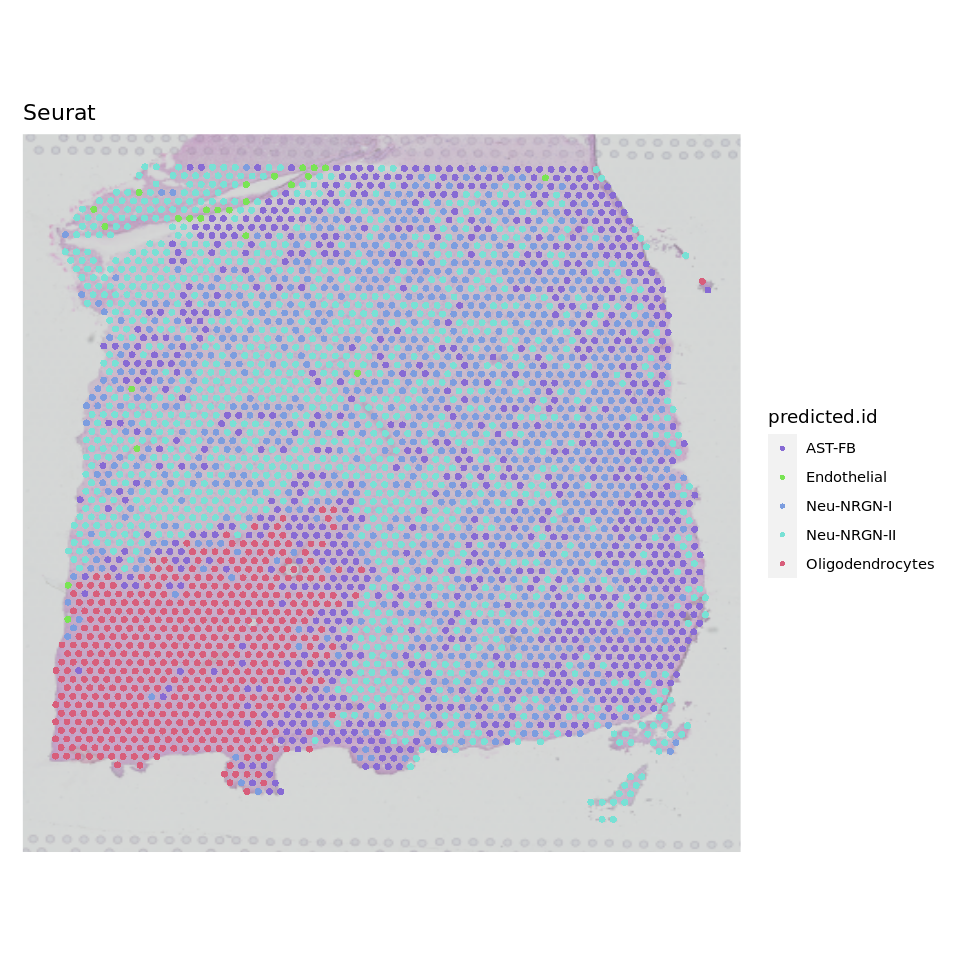

In [311]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(seurat.res, group.by = 'predicted.id', pt.size = 1.2, image.alpha = 0.5, cols = cell.colors, stroke = 0) + ggtitle('Seurat')
ggsave(file.path(out.figs.dir, 'seurat.entire.UMAP.pdf'), width = 8, height = 6)

In [312]:
length(f.ctypes <- seurat.res$predicted.id %>% unique)

[1] 5

In [313]:
f.ctypes <- seurat.res$predicted.id %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(seurat.res, predicted.id == ct) %>% Cells
    obj.sub <- seurat.res[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 1, group.by = 'predicted.id', cols = cell.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

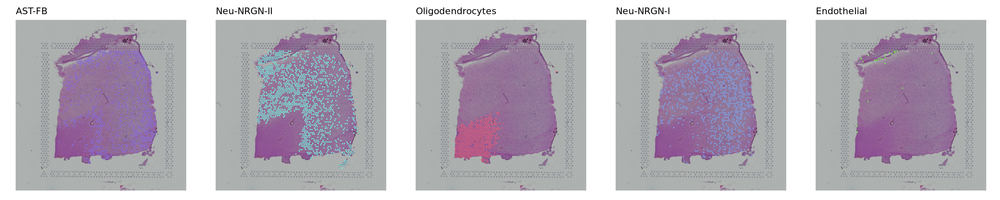

In [314]:
options(repr.plot.width = 20, repr.plot.height = 4)
ggarrange(plotlist = gps, nrow = 1, ncol = 5)
ggsave(file.path(out.figs.dir, 'seurat.split.UMAP.pdf'), width = 12, height = 4)
ggsave(file.path(out.figs.dir, 'seurat.split.UMAP.eps'), width = 12, height = 4)

In [345]:
seurat.res$predicted.id <- factor(seurat.res$predicted.id, levels = names(cell.colors))
cell.counts <- lapply(levels(brain.st$spatialLIBD), function(zone) {
    cells <- subset(brain.st, spatialLIBD == zone) %>% Cells
    meta.sub <- seurat.res@meta.data[colnames(seurat.res) %in% cells, ]
    table(meta.sub$predicted.id)    
}) %>% do.call(rbind, .) %>% `rownames<-`(levels(brain.st$spatialLIBD))

prop.xx <- sweep(cell.counts, 2, colSums(cell.counts), '/')
options(repr.plot.width = 6, repr.plot.height = 4)
pheatmap::pheatmap(prop.xx, cluster_cols = FALSE, cluster_rows = FALSE, border_color = NA, color = colorRampPalette(rev(brewer.pal(n = 7, name = "RdYlGn")))(100), filename = file.path(out.figs.dir, 'seurat.pheatmap.pdf'), width = 8, height = 4)

### Comparison of the performace based on cellular compositions, take CARD deconvolution results as standard

In [401]:
brain.sc$cluster <- factor(brain.sc$cluster, levels = unique(brain.sc$cluster))

In [402]:
card.res <- readRDS('../2.results/DLPFC/data/DLPFC.card.RDS')$decon

In [403]:
prop.card <- card.res@Proportion_CARD * 10
prop.card <- apply(prop.card, 1, ceiling) %>% t

In [404]:
prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.card <- colSums(prop.card) / sum(prop.card) * 100
prop.card <- prop.card[names(prop)]

In [437]:
prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.cell2spatial <- cell2spatial$CellType %>% table %>% {./sum(.)} * 100
prop[names(prop.cell2spatial)] <- prop.cell2spatial
prop.cell2spatial <- prop

prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.cytospace <- cytospace$CellType %>% table %>% {./sum(.)} * 100
prop[names(prop.cytospace)] <- prop.cytospace
prop.cytospace <- prop

prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.cell.trek <- cell.trek$cluster %>% table %>% {./sum(.)} * 100
prop[names(prop.cell.trek)] <- prop.cell.trek
prop.cell.trek <- prop

prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.tangram <- tangram$cluster %>% table %>% {./sum(.)} * 100
prop[intersect(names(prop.tangram), names(prop))] <- prop.tangram[intersect(names(prop.tangram), names(prop))]
prop.tangram <- prop

prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.seurat <- seurat.res$predicted.id %>% table %>% {./sum(.)} * 100
prop[names(prop.seurat)] <- prop.seurat
prop.seurat <- prop

In [438]:
prop.df <- cbind.data.frame(CARD = prop.card, Cell2Spatial = prop.cell2spatial, CytoSPACE = prop.cytospace, CellTrek = prop.cell.trek, Tangram = prop.tangram, Seurat = prop.seurat)

In [439]:
openxlsx::write.xlsx(prop.df, file = file.path(out.data.dir, 'methods.corr.vs.card.xlsx'))

In [440]:
prop.df$CellType <- rownames(prop.df)
gps <- lapply(colnames(prop.df)[2 : (ncol(prop.df) - 1)], function(meth) {
    plot.df.sub <- prop.df[, c('CARD', meth, 'CellType')] %>% `colnames<-`(c('CARD', 'Y', 'CellType'))
    ggplot(plot.df.sub, aes(x = CARD, y = Y)) + geom_point(size = 4, aes(color = CellType)) + theme_classic() + 
        geom_smooth(method = lm, se = TRUE) + ylab(meth) + ggpubr::stat_cor() + scale_color_manual(values = cell.colors)
})

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


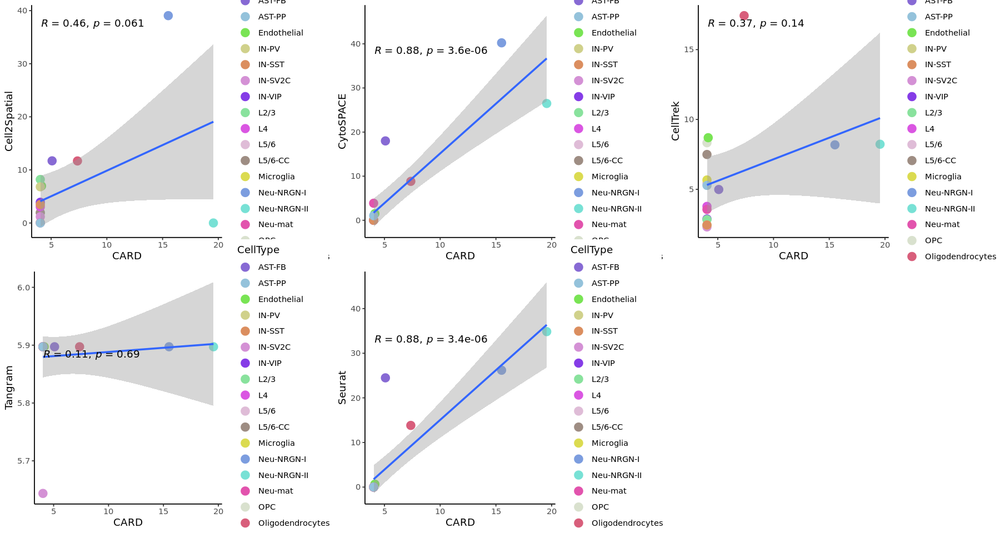

In [441]:
options(repr.plot.width = 15, repr.plot.height = 8)
ggarrange(plotlist = gps, nrow = 2, ncol = 3)
ggsave(file.path(out.figs.dir, 'methods.corr.vs.card.pdf'), width = 15, height = 8)

### Enrichment score analysis

In [77]:
Idents(brain.st) <- brain.st$spatialLIBD
markers.new <- FindAllMarkers(brain.st, only.pos = TRUE, logfc.threshold = 0.25, min.pct = 0.25, assay = 'SCT')
top20.markers <- markers.new %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC)

Calculating cluster L1

Calculating cluster L2

Calculating cluster L3

Calculating cluster L4

Calculating cluster L5

Calculating cluster L6

Calculating cluster WM



In [367]:
top20.markers.sc <- markers.sc %>% group_by(cluster) %>% top_n(n = 30, wt = avg_log2FC)

In [368]:
marker.lust <- split(top20.markers.sc$gene, top20.markers.sc$cluster)

In [370]:
card.res <- readRDS('../2.results/DLPFC/data/DLPFC.card.RDS')$decon@Proportion_CARD[, names(marker.lust)]
colnames(card.res) <- paste0('Cluster', 1 : ncol(card.res))
brain.st@meta.data <- cbind.data.frame(brain.st@meta.data, card.res)

In [371]:
avgDist <- function(obj, brain.st, ctype, p.cut = 0.05) {
    res <- lapply(1 : length(names(marker.lust)), function(idx) {
        cell.name <- names(marker.lust)[idx]
        scores <- brain.st@meta.data[, paste0('Cluster', idx)] %>% `names<-`(rownames(brain.st@meta.data))
        pvals <- pnorm(scores, mean = mean(scores), sd = sd(scores), lower.tail = FALSE)
        spots <- pvals[pvals < p.cut] %>% names
        if (length(spots) == 0) return(0)
        if (!(cell.name %in% unique(obj@meta.data[, ctype]))) return(0)
        if (sum(spots %in% obj$SpotName) == 0) return(0)
        #xx <- subset(obj, SpotName %in% spots)
        xx <- obj
        if (!(cell.name %in% unique(xx@meta.data[, ctype]))) return(0)
        xx <- table(xx$SpotName, xx@meta.data[, ctype])
        #pre <- colSums(xx > 0)[cell.name]
        pre <- rownames(xx)[which(xx[, cell.name] > 0)]
        length(intersect(spots, pre)) / length(union(spots, pre)) * 100
    }) %>% unlist(.) %>% as.vector #%>% mean
    mean(res) * sum(res > 0) / length(res)
}

In [377]:
xx.1 <- avgDist(cell2spatial, brain.st, 'CellType', p.cut = 0.01)
print(xx.1)

[1] 5.157571


In [379]:
cytospace$SpotName <- cytospace$SpotID 
xx.2 <- avgDist(cytospace, brain.st, 'CellType', p.cut = 0.01)
print(xx.2)

[1] 2.644868


In [380]:
cell.trek$SpotName <- cell.trek$Spot 
xx.3 <- avgDist(cell.trek, brain.st, 'cluster', p.cut = 0.01)
print(xx.3)

[1] 2.070788


In [378]:
tangram$SpotName <- tangram$SpotID
tangram$SpotName <- gsub('-151673', '\\.151673', tangram$SpotName)
xx.4 <- avgDist(tangram, brain.st, 'cluster', p.cut = 0.01)
print(xx.4)

[1] 4.185275


In [376]:
seurat.res$SpotName <- rownames(seurat.res@meta.data)
xx.5 <- avgDist(seurat.res, brain.st, 'predicted.id', p.cut = 0.05)
print(xx.5)

[1] 2.097643


In [381]:
plot.df <- cbind.data.frame(Index = c(xx.1, xx.2, xx.3, xx.4, xx.5), Method = c('Cell2Spatial', 'CytoSPACE', 'CellTrek', 'Tangram', 'Seurat'), Data = 'DLPFC')

In [382]:
openxlsx::write.xlsx(plot.df, file = file.path(out.data.dir, 'DLPFC.acc.xlsx'))

### Number of cell types projected

In [442]:
number.cts <- c(
    Reference = length(cell.colors),
    Cell2Spatial = unique(cell2spatial$CellType) %>% length, 
    CytoSPACE = unique(cytospace$CellType) %>% length, 
    CellTrek = unique(cell.trek$cluster) %>% length, 
    Tangram = unique(tangram$cluster) %>% length, 
    Seurat = unique(seurat.res$predicted.id) %>% length    
)
number.cts

Reference Cell2Spatial    CytoSPACE     CellTrek      Tangram       Seurat 
          17           15            8           17           17            5

png 
  2

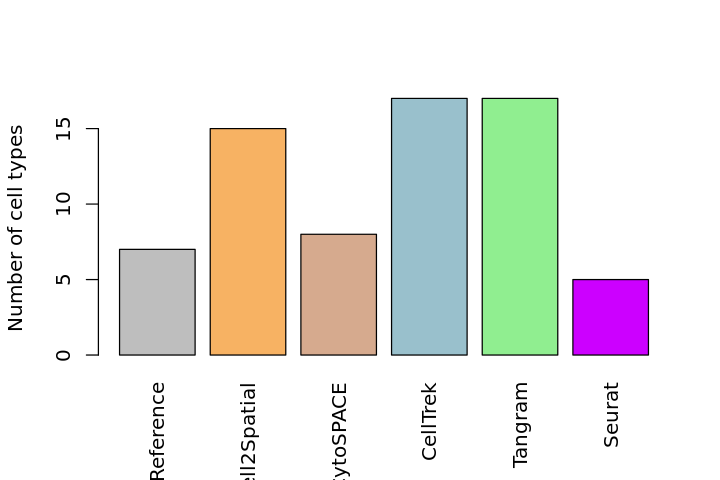

In [349]:
options(repr.plot.width = 6, repr.plot.height = 4)

pdf(file.path(out.figs.dir, 'number.of.ctypes.pdf'), width = 6, height = 4)
bp <- barplot(number.cts, las = 3, ylab = 'Number of cell types', col = MTH_COLOR)
text(bp, 20, labels = round(number.cts, digits = 2))

dev.off()
barplot(number.cts, las = 3, ylab = 'Number of cell types', col = MTH_COLOR)